**triple pendulum on a cart - python simulation and animation of a periodic orbit**

This jupyter notebook includes all needed calculations for a periodic orbit maneuver of a triple pendulum on a cart by means of inversion-based feedforward control design for finite-time transitions. As all calculations have been done using a well known commercial numerical computing environment in the past, the main goal of this notebook is to translate all involved steps to python and its amazing libraries (numpy, sympy, scipy, plotly and so on).

> [1] 1994 - Murray, Li, Sastry: *A Mathematical Introduction to Robotic Manipulation* (https://www.ce.cit.tum.de/fileadmin/w00cgn/rm/pdf/murray-li-sastry-94-complete.pdf)

> [2] 1972 - Kwakernak, Sivan: *Linear Optimal Control Systems*

> [3] 1979 - Bekir, Bucy: *Periodic equilibria for matrix riccati equations*

> [4] 2021 - Benjamin Jahn, Lars Watermann, Johann Reger: *On the design of stable periodic orbits of a triple pendulum on a cart with experimental validation* (https://doi.org/10.1016/j.automatica.2020.109403)




Notes:

*   indexing starts at zero with the cart position, i.e. $q_0 = x_c$
*   angular positions and velocities are defined absolutely (in general joint based measurements of a link orientation is relative to the previous link)

(Benjamin Jahn, TU Ilmenau, 2021)

**schematic representation of triple pendulum and all its kinematic and dynamic parameters**

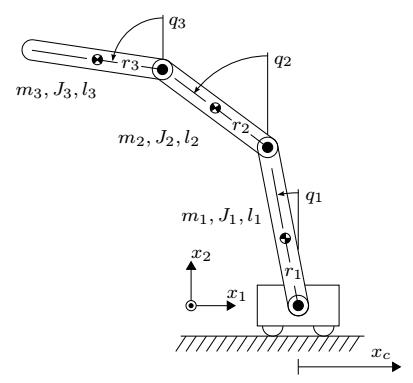

**video of the limit cycle maneuver of a triple pendulum on a cart**

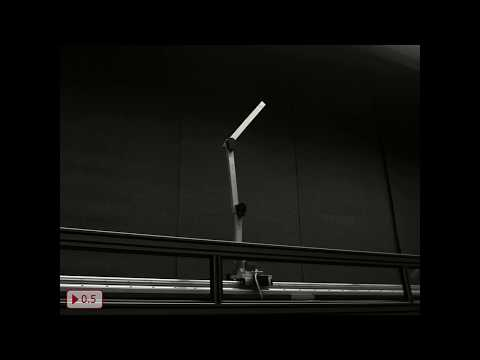

In [71]:
from datetime import timedelta
from IPython.display import YouTubeVideo
YouTubeVideo('syygHNU0RCY', start=132, end=152, autoplay=0, width=600, height=400)

# Initilization

**initialization:** clear workspace, define latex use for display

In [72]:
# clear workspace
%reset -f

In [73]:
# latex math display
from IPython.display import Math, Latex

def latexDisplay(latex_obj): display(Math(latex_obj))
# def latexDisplay(latex_obj): display(Latex(r'$$' + (latex_obj) + r'$$'))

# Kinematics and Dynamics

**symbolic computation of the dynamics of a triple pendulum on cart using Lagrange:** derive dynamics using Lagrange equations of the second kind [1, p.168ff]

In [74]:
# import sympy for symbolic computations
from sympy import *

In [75]:
# generalized coordinates and their derivatives
q0 = Symbol(r'q_0', real=True) # cart translational position (redefined from x_c in figure)
q1 = Symbol(r'q_1', real=True) # first joint rotational position
q2 = Symbol(r'q_2', real=True) # second joint rotational position
q3 = Symbol(r'q_3', real=True) # third joint rotational position
q = Matrix([q0, q1, q2, q3])

dq0 = Symbol(r'\dot{q}_0', real=True) # cart translational velocity
dq1 = Symbol(r'\dot{q}_1', real=True) # first joint rotational velocity
dq2 = Symbol(r'\dot{q}_2', real=True) # second joint rotational velocity
dq3 = Symbol(r'\dot{q}_3', real=True) # third joint rotational velocity
dq = Matrix([dq0, dq1, dq2, dq3])

ddq0 = Symbol(r'\ddot{q}_0', real=True) # cart translational acceleration
ddq1 = Symbol(r'\ddot{q}_1', real=True) # first joint rotational acceleration
ddq2 = Symbol(r'\ddot{q}_2', real=True) # second joint rotational acceleration
ddq3 = Symbol(r'\ddot{q}_3', real=True) # third joint rotational acceleration
ddq = Matrix([ddq0, ddq1, ddq2, ddq3])

In [76]:
# input - force applied to cart
f = Symbol('f', real=True)

In [77]:
# time dependency and dictionary for substitution
t = symbols(r't', real=True, positive=True) # time

# positions
q0_t = Function(r'q_0', real=True)(t) # cart translational position
q1_t = Function(r'q_1', real=True)(t) # first joint rotational position
q2_t = Function(r'q_2', real=True)(t) # second joint rotational position
q3_t = Function(r'q_3', real=True)(t) # third joint rotational position
q_t = Matrix([q0_t, q1_t, q2_t, q3_t])

q_t2s = {q0_t:q0, q1_t:q1, q2_t:q2, q3_t:q3} # qx(t) -> qx
q_s2t = {q0:q0_t, q1:q1_t, q2:q2_t, q3:q3_t} # qx -> qx(t)

# velocities
dq0_t = Function(r'\dot{q}_0', real=True)(t) # cart translational velocity
dq1_t = Function(r'\dot{q}_1', real=True)(t) # first joint rotational velocity
dq2_t = Function(r'\dot{q}_2', real=True)(t) # second joint rotational velocity
dq3_t = Function(r'\dot{q}_3', real=True)(t) # third joint rotational velocity
dq_t = Matrix([dq0_t, dq1_t, dq2_t, dq3_t])

dq_t2s = {dq0_t:dq0, dq1_t:dq1, dq2_t:dq2, dq3_t:dq3} # dqx(t) -> dqx
dq_s2t = {dq0:dq0_t, dq1:dq1_t, dq2:dq2_t, dq3:dq3_t} # dqx -> dqx(t)

q2dq = {diff(q0_t,t):dq0_t, diff(q1_t,t):dq1_t, diff(q2_t,t):dq2_t, diff(q3_t,t):dq3_t} # substitute first derivatives  
            
# accelerations
ddq0_t = Function(r'\ddot{q}_0', real=True)(t) # cart translational acceleration
ddq1_t = Function(r'\ddot{q}_1', real=True)(t) # first joint rotational acceleration
ddq2_t = Function(r'\ddot{q}_2', real=True)(t) # second joint rotational acceleration
ddq3_t = Function(r'\ddot{q}_3', real=True)(t) # third joint rotational acceleration
ddq_t = Matrix([ddq0_t, ddq1_t, ddq2_t, ddq3_t])

ddq_t2s = {ddq0_t:ddq0, ddq1_t:ddq1, ddq2_t:ddq2, ddq3_t:ddq3} # ddqx(t) -> ddqx
ddq_s2t = {ddq0:ddq0_t, ddq1:ddq1_t, ddq2:ddq2_t, ddq3:ddq3_t} # ddqx -> ddqx(t)

dq2ddq = {diff(dq0_t,t):ddq0_t, diff(dq1_t,t):ddq1_t, diff(dq2_t,t):ddq2_t, diff(dq3_t,t):ddq3_t} # substitute second derivatives    

In [78]:
# kinematic parameter
l1, l2 = symbols('l_1, l_2', real=True, positive=True) # length of each link
a1, a2, a3  = symbols('a_1, a_2, a_3', real=True, positive=True) # distance to the center of mass of each link from its pivot (redefined from r_1, r_2, r_3 in figure)

# dynamic parameter
J1, J2, J3 = symbols('J_1, J_2, J_3', real=True, positive=True) # moment of inertia of each link
m0, m1, m2, m3 = symbols('m_0, m_1, m_2, m_3', real=True, positive=True) # mass of each link
d0, d1, d2, d3 = symbols('d_0, d_1, d_2, d_3', real=True, positive=True) # relative friction of each link

grav = symbols('g', real=True, positive=True) # gravitational constant

In [79]:
# planar rotation
def rot(q): return Matrix([[cos(q), -sin(q)],[sin(q), cos(q)]])

In [80]:
# positions of center of mass
p0 = Matrix([q0_t, 0])
p1 = p0 + rot(q1_t)*Matrix([0, a1])
p2 = p0 + rot(q1_t)*Matrix([0, l1]) + rot(q2_t)*Matrix([0, a2])
p3 = p0 + rot(q1_t)*Matrix([0, l1]) + rot(q2_t)*Matrix([0, l2]) + rot(q3_t)*Matrix([0, a3])

latexDisplay(r'p_0 =' + latex(p0.subs(q_t2s)))
latexDisplay(r'p_1 =' + latex(p1.subs(q_t2s)))
latexDisplay(r'p_2 =' + latex(p2.subs(q_t2s)))
latexDisplay(r'p_3 =' + latex(p3.subs(q_t2s)))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [81]:
# velocity of center of mass
dp0 = diff(p0, t).subs(q2dq)
dp1 = diff(p1, t).subs(q2dq)
dp2 = diff(p2, t).subs(q2dq)
dp3 = diff(p3, t).subs(q2dq)

latexDisplay(r'\dot{p}_0 =' + latex(dp0.subs(q_t2s).subs(dq_t2s)))
latexDisplay(r'\dot{p}_1 =' + latex(dp1.subs(q_t2s).subs(dq_t2s)))
latexDisplay(r'\dot{p}_2 =' + latex(dp2.subs(q_t2s).subs(dq_t2s)))
latexDisplay(r'\dot{p}_3 =' + latex(dp3.subs(q_t2s).subs(dq_t2s)))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [82]:
# kinetic energy
T_trans = Rational(1,2)*m0*dp0.T*dp0 + Rational(1,2)*m1*dp1.T*dp1 + Rational(1,2)*m2*dp2.T*dp2 + Rational(1,2)*m3*dp3.T*dp3; T_trans = T_trans[0]
T_rot = Rational(1,2)*J1*dq1_t**2 + Rational(1,2)*J2*dq2_t**2 + Rational(1,2)*J3*dq3_t**2
T = T_trans + T_rot; T = simplify(T)

latexDisplay(r'T =' + latex(T.subs(q_t2s).subs(dq_t2s)))

<IPython.core.display.Math object>

In [83]:
# potential energy
V = m0*Matrix([0, grav]).T*p0 + m1*Matrix([0, grav]).T*p1 + m2*Matrix([0, grav]).T*p2 + m3*Matrix([0, grav]).T*p3; V = V[0]

latexDisplay(r'V =' + latex(V.subs(q_t2s).subs(dq_t2s)))

<IPython.core.display.Math object>

In [84]:
# Lagrangian
L = T-V

# Lagrange equation
Lode = diff(Matrix([L]).jacobian(dq_t),t) - Matrix([L]).jacobian(q_t); Lode = Lode.T
Lode = Lode.subs(q2dq).subs(dq2ddq)

latexDisplay(r'0 =' + latex(Lode.subs(q_t2s).subs(dq_t2s).subs(ddq_t2s)))

<IPython.core.display.Math object>

In [85]:
# rephrase as robotic equation of motion - get inertia matrix
M = Lode.jacobian(ddq_t); M = factor(M)

latexDisplay(r'M(q) =' + latex(M.subs(q_t2s)))

<IPython.core.display.Math object>

In [86]:
# rephrase as robotic equation of motion - get Coriolis matrix such that to dM-2C is skew-symmetric (alternatively via Christoffel symbols)
Lode_diff = Lode - M*ddq_t; Lode_diff = simplify(Lode_diff)
C = Rational(1,2)*Lode_diff.jacobian(dq_t)

# check wether C is defined according to definition in [1]
skew_test = (diff(M, t).subs(q2dq) - 2*C) + (diff(M, t).subs(q2dq) - 2*C).T; skew_test = simplify(simplify(skew_test))
if skew_test.is_zero_matrix:
  latexDisplay(r'C(q, \dot{q}) \text{ defined such that } \dot{M}(q) - 2C(q, \dot{q}) \text{ is skew-symmetric}')
else:
  latexDisplay(r'\text{something went wrong}')

latexDisplay(r'C(q, \dot{q}) =' + latex(C.subs(q_t2s).subs(dq_t2s)))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [87]:
# rephrase as robotic equation of motion - get vector of gravitational forces acting on each link
g = Lode_diff - C*dq_t; g = simplify(g)

latexDisplay(r'g(q) =' + latex(g.subs(q_t2s).subs(dq_t2s)))

<IPython.core.display.Math object>

In [88]:
# check whether Lagrange ODE is complete and display robotic equation of motion
ode_check = M*ddq_t+C*dq_t+g-Lode; ode_check = simplify(ode_check)
if ode_check.is_zero:
  latexDisplay(r'\text{robotic equation is valid}')
  
latexDisplay(r'M(q) \ddot{q} + C(q, \dot{q}) \dot{q} + g(q) = -D \dot{q} + \begin{bmatrix} 1 \\ 0 \\ 0 \\ 0\\ \end{bmatrix} f')

<IPython.core.display.Math object>

In [89]:
# rephrase as robotic equation of motion - define damping matrix
# since joint positions are defined absolutely but damping only depends on the relative velocity of each joint, D is defined as follows
D = Matrix([[d0, 0, 0, 0],[0, d1+d2, -d2, 0],[0, -d2, d2+d3, -d3],[0, 0, -d3, d3]])

latexDisplay(r'D =' + latex(D))

<IPython.core.display.Math object>

# Simplifications for Control Design

assumption: the cart is being controlled to behave like a perfect double integrator (all forces acting on the cart induced by links are perfectly compensated). This can be achieved by an underlying speed controller. However, cart acceleration is defined as plant input. Control output (cart acceleration) is then integrated and used as velocity command to the underlying speed controller for real world implementation. 

--> cart acceleration acts as new plant input (control output)



In [90]:
# control law that renders cart dynamics as double integrator with new input v = ddq0
v = Symbol(r'\mathcal{v}', real=True) # new input signal
f = D[0,0:4]*dq_t + g[0,0:4] + C[0,0:4]*dq_t + M[0,1:4]*ddq_t[1:4,0] + M[0,0]*Matrix([v]); f = f[0]

latexDisplay(r'f =' + latex(f.subs(q_t2s).subs(dq_t2s).subs(ddq_t2s)))

<IPython.core.display.Math object>

In [91]:
# substitution to cart dynamics (first Lagrange equation) results in double integrator
cart_ode = Lode[0]-f+(D[0,0:4]*dq_t)[0];  cart_ode = simplify(cart_ode)
latexDisplay(r'0 =' + latex(cart_ode.subs(ddq_t2s)) + r' \Rightarrow' + latex(ddq0) + '=' + latex(v))

<IPython.core.display.Math object>

In [92]:
# some redefinition for separation of translational and rotational system
xc = Symbol(r'\mathcal{x}_c', real=True) # cart translational position 
phi1 = Symbol(r'\mathcal{\varphi}_1', real=True) # first joint rotational position
phi2 = Symbol(r'\mathcal{\varphi}_2', real=True) # second joint rotational position
phi3 = Symbol(r'\mathcal{\varphi}_3', real=True) # third joint rotational position

dxc = Symbol(r'\dot{\mathcal{x}}_c', real=True) # cart translational position 
dphi1 = Symbol(r'\dot{\mathcal{\varphi}}_1', real=True) # first joint rotational velocity
dphi2 = Symbol(r'\dot{\mathcal{\varphi}}_2', real=True) # second joint rotational velocity
dphi3 = Symbol(r'\dot{\mathcal{\varphi}}_3', real=True) # third joint rotational velocity

q2phi = {q1_t:phi1, q2_t:phi2, q3_t:phi3} # substitution of first derivatives
dq2dphi = {dq1_t:dphi1, dq2_t:dphi2, dq3_t:dphi3} # substitution of second derivatives   

# display substitutions to be made
latexDisplay(r'q_{0} = x_c')
latexDisplay(r'q_{[123]} = \mathcal{\varphi}')
latexDisplay(r'M_{[123,123]} = \mathcal{M}')
latexDisplay(r'C_{[123,123]} = \mathcal{C}')
latexDisplay(r'D_{[123,123]} = \mathcal{D}')
latexDisplay(r'g_{[123]} = \mathcal{g}')

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [93]:
# there are no Coriolis/Centrifugal forces acting on the links induced by the cart motion (see first column of C) --> only forces acting on the links induced by the cart motion are inertia forces (first column of M) depending on ddq0 or v
b = -M[1:4,0]

latexDisplay(r'\mathcal{b}(\mathcal{\varphi}) = -M_{[123,0]} = ' + latex(b.subs(q2phi)))

<IPython.core.display.Math object>

In [94]:
# precontrolled dynamics of overall system is then given by
latexDisplay(r'\ddot{x}_c=' + latex(v))
latexDisplay(r'\mathcal{M}(\mathcal{\varphi}) \ddot{\mathcal{\varphi}}+ \mathcal{C}(\mathcal{\varphi}, \dot{\mathcal{\varphi}}) \dot{\mathcal{\varphi}} + \mathcal{g}(\mathcal{\varphi}) = -\mathcal{D} \dot{\mathcal{\varphi}} + \mathcal{b}(\mathcal{\varphi})v')

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [95]:
# summary of precontrolled dynamics
latexDisplay(r'\mathcal{M}(\mathcal{\varphi}) =' + latex(M[1:4,1:4].subs(q2phi)))
latexDisplay(r'\mathcal{C}(\mathcal{\varphi},\dot{\mathcal{\varphi}}) =' + latex(C[1:4,1:4].subs(q2phi).subs(dq2dphi)))
latexDisplay(r'\mathcal{D} =' + latex(D[1:4,1:4]))
latexDisplay(r'\mathcal{g}(\mathcal{\varphi}) =' + latex(g[1:4,0].subs(q2phi)))
latexDisplay(r'\mathcal{b}(\mathcal{\varphi}) =' + latex(b.subs(q2phi)))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

# Simulation 1: Falling Pendulum

**run simulation of falling pendulum with fixed cart position:** substitute numerical values and run simulate of falling pendulum with fixed cart position

In [96]:
# some more imports
import numpy as np
from math import ceil, floor
from scipy.integrate import solve_ivp

In [97]:
# experimental setup parameters
l1_num = 0.323; l2_num = 0.418; l3_num = 0.480 # link length [m]
a1_num = 0.209; a2_num = 0.270; a3_num = 0.224 # distance to center of mass [m]

m1_num = 0.870; m2_num = 0.928; m3_num = 0.552 # mass [kg]
J1_num = 0.013; J2_num = 0.024; J3_num = 0.019 # moment of inertia [Nms^2]
d1_num = 0.015; d2_num = 0.015; d3_num = 0.015 # viscous friction coefficient [Nm (rad/s)^-1]

# adjusted parameters
l1_num = 0.319; l2_num = 0.419; l3_num = 0.480 # link length [m]
a1_num = 0.221; a2_num = 0.225; a3_num = 0.185 # distance to center of mass [m]

m1_num = 0.653; m2_num = 0.852; m3_num = 0.615 # mass [kg]
J1_num = 0.009; J2_num = 0.024; J3_num = 0.021 # moment of inertia [Nms^2]
#d1_num = 0.016; d2_num = -0.005; d3_num = 0.001 # viscous friction coefficient [Nm (rad/s)^-1]
d1_num = 0.016; d2_num = 0.005; d3_num = 0.001 # viscous friction coefficient [Nm (rad/s)^-1]

grav_num = 9.81 # gravitational constant [m^3 (kg s^2)^-1]

param_dict = {l1:l1_num, l2:l2_num, a1:a1_num, a2:a2_num, a3:a3_num, m1:m1_num, m2:m2_num, m3:m3_num, J1:J1_num, J2:J2_num, J3:J3_num, d1:d1_num, d2:d2_num, d3:d3_num, grav:grav_num} # dictionary for parameter substitution

In [98]:
# solve robotic equation for explicit ode
ode = M[1:4,1:4].LUsolve(-C[1:4,1:4]*dq_t[1:4,0]-g[1:4,0]-D[1:4,1:4]*dq_t[1:4,0]+b*ddq0)
ode = ode.subs(q2phi).subs(dq2dphi)
ode_sys = Matrix([dphi1, dphi2, dphi3, *ode]) # express three odes of second order as system of 6 odes of first order
ode_f = lambdify([phi1, phi2, phi3, dphi1, dphi2, dphi3, ddq0, *param_dict,], [*ode_sys])

In [99]:
# execute simulation
T = 8; Ts = 1e-3
x0 = np.array([0,0,0,0,0,0.4])
t_ = np.linspace(0,T, ceil(T/Ts+1), endpoint=True)
sol = solve_ivp(lambda t,x: ode_f(*x, 0, *param_dict.values()), [0,t_[-1]], x0, 'RK45', t_eval = t_, rtol=1e-6) # solve ode without any input and nominal parameters

**plot angular postions:**
plot angular positions of each link using plotly

In [100]:
# import plotting packages
import plotly.graph_objs as go
import plotly.io as pio
pio.templates.default = "none"
pio.renderers.default = "notebook_connected"

In [101]:
# define generic plot function for angular position of triple pendulum
def plot_pendulum(sol):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x = sol.t, y = sol.y[0,:]/np.pi, name=r'$q_1$', line=dict(width=2, color='blue')))
    fig.add_trace(go.Scatter(x = sol.t, y = sol.y[1,:]/np.pi, name=r'$q_2$', line=dict(width=2, color='green')))
    fig.add_trace(go.Scatter(x = sol.t, y = sol.y[2,:]/np.pi, name=r'$q_3$', line=dict(width=2, color='red')))

    fig.update_layout(height=400, width=900, margin=go.layout.Margin(t=20), 
        xaxis=dict(title=r'$\text{time in seconds}$', mirror=True, ticks='outside', showline=True),
        yaxis=dict(title=r'$\text{angular position in } \pi \text{ rad}$', 
            tickmode = 'linear', tick0 = 0.0, dtick = 1, mirror=True, ticks='outside', showline=True))
        
    fig.show()

In [102]:
# plot angular positions
plot_pendulum(sol)

**animate falling pendulum** animate falling pendulum using matplotlib

In [103]:
## import plotting packages
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')

# define pendulum animation function
def animate_pendulum(sol, cart_position, fps=25):

    # frame number and index distance for given fps (tried to avoid interpolation to not slow down animation even further)
    T2anim = sol.t[-1]
    frameNumber = fps*T2anim
    didx = floor(len(sol.t)/frameNumber)

    # create and setup figure
    fig, ax = plt.subplots(figsize=(14,10))
    ax.set_aspect('equal')
    # plt.axis('equal'); 
    plt.close()
    ax.set_xlim((-2, 2)); ax.set_ylim((-1.5, 1.5))

    # create line objects
    line0, = ax.plot([], [], lw=2,c='k')
    line1, = ax.plot([], [], lw=8,c='k')
    line2, = ax.plot([], [], lw=4,c='b')
    line3, = ax.plot([], [], lw=4,c='g')
    line4, = ax.plot([], [], lw=4,c='r')

    # initialization function: plot the background of each frame
    def init():
        # draw rail
        line0.set_data(np.linspace(-2, 2, 100), 0*np.linspace(-2, 2, 100))

        return (line0,) # return line objects

    # animation function: this is called sequentially
    def animate(i):

        # current configuration of pendulum
        p0 = np.array([cart_position[i*didx],0])
        p1 = p0 + np.array([-l1_num*sin(sol.y[0,i*didx]), l1_num*cos(sol.y[0,i*didx])])
        p2 = p1 + np.array([-l2_num*sin(sol.y[1,i*didx]), l2_num*cos(sol.y[1,i*didx])])
        p3 = p2 + np.array([-l3_num*sin(sol.y[2,i*didx]), l3_num*cos(sol.y[2,i*didx])])
      
        # update line data
        line1.set_data([p0[0]-0.1, p0[0]+0.1],[p0[1], p0[1]])
        line2.set_data([p0[0], p1[0]],[p0[1], p1[1]])
        line3.set_data([p1[0], p2[0]],[p1[1], p2[1]])
        line4.set_data([p2[0], p3[0]],[p2[1], p3[1]])
      
        return (line1,line2,line3,line4) # return line objects

    # return animation object
    return animation.FuncAnimation(fig, animate, init_func=init, frames=floor(frameNumber), interval=1/fps*1000, blit=True)


In [104]:
# animate falling pendulum 
anim = animate_pendulum(sol, np.zeros(sol.t.size)) # no control input --> cart fixed in position
anim

# Feedorward Control Design for Periodic Orbit

**periodic orbit as two-point boundary value problem (bvp):** finding feedforward for the periodic orbit maneuver of triple pendulum based on solution of bvp

In [105]:
# parameterizable cart position via setup function
# determine cart acceleration from setup function by its second derivative
# as control input is cart acceleration, chose setup function such that cart position is zero at start and end of transition

# needed symbols
T = Symbol('T', real=True) # transition time
p0 = Symbol('p_0', real=True); p1 = Symbol('p_1', real=True); p2 = Symbol('p_2', real=True); p3 = Symbol('p_3', real=True); p4 = Symbol('p_4', real=True); p5 = Symbol('p_5', real=True)
p = Matrix([p0, p1, p2, p3, p4, p5]) # 6 parameters needed (#p = #bc-#ode = 2*6-6)

# design setup function as cosine series with periods multiple of transition time T including zero up to seven (zeroth and first factor is determined by desired cart position to be zero at the beginning and end)
#xc_t = Piecewise(((-p[0]-p[2]-p[4])*cos(0*pi*t/T)+(-p[1]-p[3]-p[5])*cos(1*pi*t/T)+p[0]*cos(2*pi*t/T)+p[1]*cos(3*pi*t/T)+p[2]*cos(4*pi*t/T)+p[3]*cos(5*pi*t/T)+p[4]*cos(6*pi*t/T)+p[5]*cos(7*pi*t/T), t <= T), (0, True))
#xc_t = Piecewise(((-3*p[0]-5*p[2]-7*p[4])*sin(1*pi*t/T)+(-2*p[1]-3*p[3]-4*p[5])*sin(2*pi*t/T)+p[0]*sin(3*pi*t/T)+p[1]*sin(4*pi*t/T)+p[2]*sin(5*pi*t/T)+p[3]*sin(6*pi*t/T)+p[4]*sin(7*pi*t/T)+p[5]*sin(8*pi*t/T), t <= T), (0, True))
xc_t = (-3*p[0]-5*p[2]-7*p[4])*sin(1*pi*Mod(t,T)/T)+(-2*p[1]-3*p[3]-4*p[5])*sin(2*pi*Mod(t,T)/T)+p[0]*sin(3*pi*Mod(t,T)/T)+p[1]*sin(4*pi*Mod(t,T)/T)+p[2]*sin(5*pi*Mod(t,T)/T)+p[3]*sin(6*pi*Mod(t,T)/T)+p[4]*sin(7*pi*Mod(t,T)/T)+p[5]*sin(8*pi*Mod(t,T)/T)
dxc_t = diff(xc_t,t).subs({diff(Mod(t,T),t):1})
ddxc_t = diff(dxc_t,t).subs({diff(Mod(t,T),t):1})

# lambdify each expression for later evaluation
cart_position = lambdify((t,T,*(p0,p1,p2,p3,p4,p5)), xc_t)
cart_velocity = lambdify((t,T,*(p0,p1,p2,p3,p4,p5)), dxc_t)
cart_acceleration = lambdify((t,T,*(p0,p1,p2,p3,p4,p5)), ddxc_t)
feedforward = cart_acceleration # cart acceleration is control output

# display equations (display order is a bit messed up)
latexDisplay(r'x_c = \Upsilon(t,p) =' + latex(trigsimp(xc_t)))
latexDisplay(r'\dot{x}_c = \dot{\Upsilon}(t,p) =' + latex(trigsimp(dxc_t)))
latexDisplay(r'\ddot{x}_c = \ddot{\Upsilon}(t,p)= ' + latex(trigsimp(ddxc_t)))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [106]:
## import bvp solver
from scipy.integrate import solve_bvp

In [107]:
deta3 = 1.89 # angular speed of third link at connection point of cycle

# boundary conditions
def bc(ya, yb, p):
    x0 = np.array([0, 0, 0, 0, 0, deta3]); # start of cycle
    xT = np.array([0, 0, 2*pi, 0, 0, deta3]); # end of cycle
    return np.concatenate((ya-x0, yb-xT))

In [108]:
# transition time (magic number as not for arbitrary transition time a solution can be found)
T = 1.096

# initial mesh grid and initial solution
N = 500
t_ = np.linspace(0,T,N, endpoint=True)
x_ = np.linspace((0, 0, 0, 0, 0, deta3), (0, 0, 2*pi, 0, 0, deta3), num=N, axis=1, endpoint=True)

# solve bvp
#bvp_sol = solve_bvp(lambda t,x,p: dx_dt(t,x, cart_acceleration(t,T,*p)), bc, t_, x_, p=np.array([0, 0, 0, 0, 0, 0]), max_nodes=2100, verbose=2)
bvp_sol = solve_bvp(lambda t,x,p: ode_f(*x, feedforward(t,T,*p), *param_dict.values()), bc, t_, x_, p=np.array([0, 0, 0, 0, 0, 0]), max_nodes=8100, verbose=2)
#bvp_sol = solve_bvp(lambda t,x,p: ode_f(*x, feedforward(t,T,*p), *param_dict.values()), bc, t_, x_, p=np.array([0.113, -0.653, -0.185, -0.083, 0.087, 0.214]), max_nodes=2100, verbose=2)
print('BVP solver has been successful: ' + str(bvp_sol.success))

   Iteration    Max residual  Max BC residual  Total nodes    Nodes added  
       1          3.02e+01       2.45e-16          500            932      
       2          1.91e+01       2.45e-16         1432           2610      
       3          2.87e-02       2.45e-16         4042           2904      
       4          2.72e-05       2.45e-16         6946             0       
Solved in 4 iterations, number of nodes 6946. 
Maximum relative residual: 2.72e-05 
Maximum boundary residual: 2.45e-16
BVP solver has been successful: True


In [109]:
# plot angular positions of bvp solution
sol.t = bvp_sol.x; sol.y = bvp_sol.y
plot_pendulum(sol)

In [110]:
# plot cart position, cart velocity and cart acceleration (control output)
from plotly.subplots import make_subplots

fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02)

fig.add_trace(go.Scatter(x = t_, y = cart_position(t_,T,*bvp_sol.p), name=r'$x_c = q_0$', line=dict(width=2, color='blue')), row=1, col=1)
fig.add_trace(go.Scatter(x = t_, y = cart_velocity(t_,T,*bvp_sol.p), name=r'$\dot{x}_c$', line=dict(width=2, color='green')), row=2, col=1)
fig.add_trace(go.Scatter(x = t_, y = cart_acceleration(t_,T,*bvp_sol.p), name=r'$\ddot{x}_c = v$', line=dict(width=2, color='red')), row=3, col=1)

fig.update_yaxes(title_text=r'$\text{cart position in m}$', row=1, col=1)
fig.update_yaxes(title_text=r'$\text{cart velocity in } \frac{\text{m}}{\text{s}}$', row=2, col=1)
fig.update_yaxes(title_text=r'$\text{cart acceleration in } \frac{\text{m}}{\text{s}^2}$', row=3, col=1)
fig.update_yaxes(mirror=True, ticks='outside', showline=True)

fig.update_xaxes(title_text=r'$\text{time in seconds}$', row=3, col=1)
fig.update_xaxes(mirror=True, ticks='outside', showline=True)

fig.update_layout(height=700, width=900, margin=go.layout.Margin(t=20),)
fig.show()

In [111]:
# in order to check bvp solution: run simulation of feedforward controlled pendulum
# deviation expected due to integration of unstable dynamics (which is why a collocation method instead of a shooting method should be used as bvp solver)
# therefore low tolerances set for simulation
x0 = [0, 0, 0, 0, 0, deta3]
t_ = np.linspace(0,T, ceil(T/Ts+1), endpoint=True)
sol = solve_ivp(lambda t, x: ode_f(*x, feedforward(t,T,*bvp_sol.p), *param_dict.values()), [0,t_[-1]], x0, 'RK45', t_eval = t_, atol=1e-12, rtol=1e-6)

In [112]:
# plot angular positions
plot_pendulum(sol)

In [113]:
# animate pendulum periodic orbit
anim = animate_pendulum(sol, cart_position(t_,T,*bvp_sol.p))
anim

# Simulation 2: Feedforward Controlled Triple Pendulum

**simulation with parameter derivations and process noise:** this is what happens in real when using feedforward solely (as in a real experiment)

In [114]:
# initialize random number generator
np.random.seed(139)

In [115]:
# deviation from nominal parameters
# param_dict = {l1:l1_num, l2:l2_num, a1:a1_num, a2:a2_num, a3:a3_num, m1:m1_num, m2:m2_num, m3:m3_num, J1:J1_num, J2:J2_num, J3:J3_num, d1:d1_num, d2:d2_num, d3:d3_num, grav:grav_num};
params_nominal = np.array([*param_dict.values()]) # original parameters
params_sigma = params_nominal/[1e4, 1e4, 1e4, 1e4, 1e4, 1e3, 1e3, 1e3, 1e3, 1e3, 1e3, 1e3, 1e3, 1e3, 1e8] # standard deviation (lengths and gravitational constant quite sure / mass, inertia and damping not so much)
params_real = np.random.normal(params_nominal, abs(params_sigma), params_nominal.size)

In [116]:
# define process noise
def process_noise(sigma):
    return np.array([*np.zeros(3), *np.random.normal(scale=sigma, size=3)])

In [117]:
# execute simulation with real parameters, process noise (and higher tolerance which also makes simulation with noise faster)
x0 = [0, 0, 0, 0, 0, deta3]
t_ = np.linspace(0,T, ceil(T/Ts+1), endpoint=True)
sol = solve_ivp(lambda t, x: ode_f(*x, feedforward(t,T,*bvp_sol.p), *params_real)+process_noise(0.2), [0,t_[-1]], x0, 'RK45', t_eval = t_, rtol=1e-4)

In [118]:
# plot angular positions of bvp solution
plot_pendulum(sol)

In [119]:
# animate pendulum periodic orbit
anim = animate_pendulum(sol, cart_position(t_,T,*bvp_sol.p))
anim

# Feedback Control Design

add feedback designed based on pendulum dynamics linearized along nominal trajectory (linear quadratic control problem) extended by cart dynamics (in order to keep cart close to initial position) [2, ch.3]

In [120]:
# extend ode by cart dynamics (double integrator)
ode_sys_ext = Matrix([*ode_sys, dq0, ddq0])
ode_ext_f = lambdify([phi1, phi2, phi3, dphi1, dphi2, dphi3, q0, dq0, ddq0, *param_dict,], [*ode_sys_ext])

# linearized pendulum dynamics
A = ode_sys_ext.jacobian([phi1, phi2, phi3, dphi1, dphi2, dphi3, q0, dq0])
b = ode_sys_ext.jacobian([ddq0])

# substitute nominal system parameters (as real parameters are not known)
A_num = A.subs(param_dict)
b_num = b.subs(param_dict)

# derive functions
A_num_f = lambdify((phi1, phi2, phi3, dphi1, dphi2, dphi3, q0, dq0, ddq0), A_num)
b_num_f = lambdify((phi1, phi2, phi3, dphi1, dphi2, dphi3, q0, dq0, ddq0), b_num)

In [121]:
# decorate scipy interp1d function for periodic interpolation
from scipy.interpolate import interp1d

def periodify(period):
    return lambda func: lambda t: func(np.mod(t,period))

In [122]:
# interpolate nominal trajectory
x_t_raw = interp1d(bvp_sol.x, bvp_sol.y, kind='cubic', bounds_error=False, fill_value=bvp_sol.y[:,-1]) # function x(t) for numeric time input
x_t = periodify(T)(lambda t: x_t_raw(t))

In [123]:
# define weighting matrices for linear quadratic control problem
#Q = np.diag([1, 1, 1, 0, 0, 0, 1, 0])*0.05 # weighting of states errors
Q = np.diag([0.1, 0.1, 10, 0, 0, 0, 10, 1])*0.1 # weighting of states errors
r = 1 # weighting of control output

In [124]:
# solve algebraic Riccati equation (are) for final value of differential Riccati equation (dre) [2, p.220ff]
# note: solution of are determines control gains for upper stationary equilibrium point (balancing regulator)
from scipy.linalg import solve_continuous_are

x_T = x_t(T); x_c = cart_position(T,T,*bvp_sol.p); v_c = cart_velocity(T,T,*bvp_sol.p); u_T = feedforward(T,T,*bvp_sol.p) # final states and input of transition trajectory
X_T = solve_continuous_are(A_num_f(*x_T, x_c, v_c, u_T), b_num_f(*x_T, x_c, v_c, u_T), Q, r) # solve are

In [125]:
# define dre (in order to compute gains k^T(t) along the time-variant transition trajectory) [2, p.218ff]
# dre: dX = -X*A-A^T*X+1/r*X*b*b^T*X
def dX(t, X, Q, r):
    X = np.reshape(X, Q.shape); # reshape flat vector back to matrix (solve_ivp only likes vectors)
    x = x_t(t); x_c = cart_position(t,T,*bvp_sol.p); v_c = cart_velocity(t,T,*bvp_sol.p); u = feedforward(t,T,*bvp_sol.p) # determine state and input at current time along the transition trajectory
    A = A_num_f(*x, x_c, v_c, u); b = b_num_f(*x, x_c, v_c, u) # determine linearization of pendulum dynamics at current time along the transition trajectory
    dX =  - np.matmul(X, A) -  np.matmul(np.transpose(A), X) + 1/r*np.matmul(X, np.matmul(b, np.matmul(np.transpose(b), X))) - Q # time- variant dre to be solved
    return dX.flatten() # flatten matrix result back to a vector (optimization potential: X is symmetric so only 6*(6+1)/2=21 entries need to be integrated instead of 6*6=36)

In [126]:
# solve differential Riccati equation backward in time
t_ = np.linspace(0,10.0*T, ceil(10.0*T/Ts+1), endpoint=True)
#dre_sol = solve_ivp(lambda t, X: dX(t, X, Q, r), [t_[-1],0], X_T.flatten(), 'RK45', t_eval = np.flip(t_), rtol=1e-6, atol=1e-6);
dre_sol = solve_ivp(lambda t, X: dX(t, X, Q, r), [t_[-1],0], np.zeros(X_T.flatten().shape), 'RK45', t_eval = np.flip(t_), rtol=1e-6, atol=1e-6)
X = dre_sol.y.reshape((*X_T.shape,-1))  # reshape flat vector solution back to matrix solution
X_t = interp1d(dre_sol.t, X) 

In [127]:
# compute control gains k^T(t) (ugly but no better solution found yet)
k = np.zeros((1,8,t_.size))
for idx, t in enumerate(t_): 
    k[:,:,idx] = -1/r*np.matmul(np.transpose(b_num_f(*x_t(t), cart_position(t,T,*bvp_sol.p), cart_velocity(t,T,*bvp_sol.p), cart_acceleration(t,T,*bvp_sol.p))), X_t(t))
k_t = interp1d(t_, k, kind='cubic', bounds_error=False, fill_value=k[:,:,-1])
#k_t = periodify(T)(lambda t: k_t_raw(t))

In [128]:
# plot control gains k^T(t)
fig = go.Figure()
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,0,:], name=r'$k_1$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,1,:], name=r'$k_2$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,2,:], name=r'$k_3$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,3,:], name=r'$k_4$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,4,:], name=r'$k_5$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,5,:], name=r'$k_6$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,6,:], name=r'$k_7$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,7,:], name=r'$k_8$', line=dict(width=2)))

fig.update_layout(height=400, width=900, xaxis=dict(title=r'$\text{time in multiple of cycle time T}$', tickmode='linear', dtick=1), yaxis=dict(title=r'$\text{control gains}$'), margin=go.layout.Margin(t=20))
fig.update_xaxes(mirror=True, ticks='outside', showline=True); fig.update_yaxes(mirror=True, ticks='outside', showline=True)
fig.show()

In [129]:
# when is periodic solution reached (how long do I have to integrate)
# plot diff of control gains k^T(t) to previous cycle in order to evaluate convergence
fig = go.Figure()
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,0,:]-k_t(t_+T)[0,0,:], name=r'$k_1$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,1,:]-k_t(t_+T)[0,1,:], name=r'$k_2$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,2,:]-k_t(t_+T)[0,2,:], name=r'$k_3$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,3,:]-k_t(t_+T)[0,3,:], name=r'$k_4$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,4,:]-k_t(t_+T)[0,4,:], name=r'$k_5$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,5,:]-k_t(t_+T)[0,5,:], name=r'$k_6$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,6,:]-k_t(t_+T)[0,6,:], name=r'$k_7$', line=dict(width=2)))
fig.add_trace(go.Scatter(x = t_/T, y = k_t(t_)[0,7,:]-k_t(t_+T)[0,7,:], name=r'$k_8$', line=dict(width=2)))

fig.update_layout(height=400, width=900, margin=go.layout.Margin(t=20), xaxis=dict(title=r'$\text{time in multiple of cycle time T}$', tickmode='linear', dtick=1), yaxis=dict(title=r'$\text{control gains difference to previous cycle}$'));
fig.update_xaxes(mirror=True, ticks='outside', showline=True); fig.update_yaxes(mirror=True, ticks='outside', showline=True)
fig.show()

In [130]:
# simple approach (decide that T-periodic Riccati equation converges after 10 periods based on previous plot)
X_T = X[:,:,-1]

In [131]:
# solve differential Riccati equation backward in time
t_ = np.linspace(0,T, ceil(T/Ts+1), endpoint=True)
dre_sol = solve_ivp(lambda t, X: dX(t, X, Q, r), [t_[-1],0], X_T.flatten(), 'RK45', t_eval = np.flip(t_), rtol=1e-8, atol=1e-8)
X = dre_sol.y.reshape((*X_T.shape,-1))  # reshape flat vector solution back to matrix solution
X_t = interp1d(dre_sol.t, X) 

In [132]:
# z = circular error(x,y)
# x in R (any continuous angle value ranging from -inf to +inf)
# y in R (any continuous angle value ranging from -inf to +inf)
# z in [-pi, pi)
def circular_error(x,y):
    diff = np.mod((x-y), 2*np.pi)
    return np.where(diff > np.pi, diff - 2*np.pi, diff)

In [133]:
# feedback controller
def feedback(t,x):
    return \
    np.matmul(k_t(t)[0, 0:3], circular_error(x[0:3],x_t(t)[0:3])) + \
    np.matmul(k_t(t)[0, 3:6], (x[3:6]-x_t(t)[3:6])) + \
    k_t(t)[0, 6]*(x[6]-cart_position(t,T,*bvp_sol.p)) + \
    k_t(t)[0, 7]*(x[7]-cart_velocity(t,T,*bvp_sol.p))

# Simulation 3: Feedforward and Feedback Controlled Triple Pendulum

In [134]:
# redefine process noise for extended system
def process_noise(sigma):
    return np.array([*np.zeros(3), *np.random.normal(scale=sigma, size=3), 0, np.random.normal(scale=sigma)])

In [135]:
# execute simulation with real parameters and feedback
x0 = [0, 0, 0, 0, 0, deta3, 0, 0]
t_ = np.linspace(0, 4.0*T, ceil(4.0*T/Ts+1), endpoint=True)
# sol = solve_ivp(lambda t, x: ode_ext_f(*x, feedforward(t,T,*bvp_sol.p)+feedback(t,x), *params_nominal)+process_noise(0.05), [0,t_[-1]], x0, 'RK45', t_eval = t_, rtol=1e-6)
sol = solve_ivp(lambda t, x: ode_ext_f(*x, feedforward(t,T,*bvp_sol.p)+feedback(t,x), *params_real)+process_noise(0.2), [0,t_[-1]], x0, 'RK45', t_eval = t_, rtol=1e-6)

In [136]:
# recalculate control actions (TODO: needs better way)
cart_acceleration_num = feedforward(t_,T,*bvp_sol.p) 
for idx, t in enumerate(sol.t): 
    cart_acceleration_num[idx] += feedback(sol.t[idx], sol.y[:,idx])
cart_position_num = sol.y[6,:]
cart_velocity_num = sol.y[7,:]

In [137]:
# plot cart position, cart velocity and cart acceleration (control output)
from plotly.subplots import make_subplots

fig = make_subplots(rows=4, cols=1, shared_xaxes=True, vertical_spacing=0.02)

fig.add_trace(go.Scatter(x = t_, y = cart_position(t_,T,*bvp_sol.p), name=r'$x_c=q_0$', line=dict(width=2, color='gray'), showlegend = False), row=1, col=1)
fig.add_trace(go.Scatter(x = t_, y = cart_position_num, name=r'$x_c$', line=dict(width=2, color='blue')), row=1, col=1)

fig.add_trace(go.Scatter(x = t_, y = cart_velocity(t_,T,*bvp_sol.p), name=r'$\dot{x}_c$', line=dict(width=2, color='gray'), showlegend = False), row=2, col=1)
fig.add_trace(go.Scatter(x = t_, y = cart_velocity_num, name=r'$\dot{x}_c$', line=dict(width=2, color='green')), row=2, col=1)

fig.add_trace(go.Scatter(x = t_, y = cart_acceleration(t_,T,*bvp_sol.p), name=r'$\ddot{x}_c = v$', line=dict(width=2, color='gray'), showlegend = False), row=3, col=1)
fig.add_trace(go.Scatter(x = t_, y = cart_acceleration_num, name=r'$\ddot{x}_c = v$', line=dict(width=2, color='red')), row=3, col=1)

fig.add_trace(go.Scatter(x = t_, y = cart_acceleration_num-cart_acceleration(t_,T,*bvp_sol.p), name=r'$\Delta v$', line=dict(width=2, color='black')), row=4, col=1)

fig.update_yaxes(title_text=r'$\text{cart position in m}$', row=1, col=1)
fig.update_yaxes(title_text=r'$\text{cart velocity in } \frac{\text{m}}{\text{s}}$', row=2, col=1)
fig.update_yaxes(title_text=r'$\text{cart acceleration in } \frac{\text{m}}{\text{s}^2}$', row=3, col=1)
fig.update_yaxes(title_text=r'$\text{feedback control input in } \frac{\text{m}}{\text{s}^2}$', row=4, col=1)
fig.update_yaxes(mirror=True, ticks='outside', showline=True)

fig.update_xaxes(title_text=r'$\text{time in seconds}$', row=4, col=1)
fig.update_xaxes(mirror=True, ticks='outside', showline=True)

fig.update_layout(height=900, width=900, margin=go.layout.Margin(t=20))
fig.show()

In [138]:
# plot angular positions of bvp solution
plot_pendulum(sol)

In [139]:
# animate pendulum periodic orbit
anim = animate_pendulum(sol, sol.y[6,:])
anim

**conclusion:** the feedforward and feedback controlled periodic orbit of the triple pendulum on a cart has been successfully implemented (in simulation), even with (parameter deviations and) process noise. Of course with bigger parameter deviations or external disturbances (hitting it with a stick) locally designed feedback based on the linearized dynamics will eventually fail to stabilize the pendulum along its predefined trajectory.
